In [ ]:
import torch
import torchaudio

print(torch.__version__)
print(torchaudio.__version__)

import matplotlib.pyplot as plt

2.6.0+cu124
2.6.0+cu124


In [ ]:
!pip install mir_eval transformers openai-whisper --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 800.5/800.5 kB 12.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.8/102.8 kB 10.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 121.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 98.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 53.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 M

In [ ]:
from IPython.display import Audio
from mir_eval import separation
from torchaudio.pipelines import HDEMUCS_HIGH_MUSDB_PLUS
from torchaudio.utils import download_asset
import soundfile as sf
from transformers import Wav2Vec2ForCTC, Wav2Vec2Processor

In [ ]:
bundle = HDEMUCS_HIGH_MUSDB_PLUS
model = bundle.get_model()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
sample_rate = bundle.sample_rate
print(f"Sample rate: {sample_rate}")

Sample rate: 44100


In [ ]:
from torchaudio.transforms import Fade

def separate_sources(
    model,
    mix,
    segment=10.0,
    overlap=0.1,
    device=None,
):
    """
    Apply model to a given mixture. Use fade, and add segments together in order to add model segment by segment.
    """
    if device is None:
        device = mix.device
    else:
        device = torch.device(device)

    batch, channels, length = mix.shape

    chunk_len = int(sample_rate * segment * (1 + overlap))
    start = 0
    end = chunk_len
    overlap_frames = overlap * sample_rate
    fade = Fade(fade_in_len=0, fade_out_len=int(overlap_frames), fade_shape="linear")

    final = torch.zeros(batch, len(model.sources), channels, length, device=device)

    while start < length - overlap_frames:
        chunk = mix[:, :, start:end]
        with torch.no_grad():
            out = model.forward(chunk)
        out = fade(out)
        final[:, :, :, start:end] += out
        if start == 0:
            fade.fade_in_len = int(overlap_frames)
            start += int(chunk_len - overlap_frames)
        else:
            start += chunk_len
        end += chunk_len
        if end >= length:
            fade.fade_out_len = 0
    return final


def plot_spectrogram(stft, title="Spectrogram"):
    magnitude = stft.abs()
    spectrogram = 20 * torch.log10(magnitude + 1e-8).numpy()
    _, axis = plt.subplots(1, 1)
    axis.imshow(spectrogram, cmap="viridis", vmin=-60, vmax=0, origin="lower", aspect="auto")
    axis.set_title(title)
    plt.tight_layout()

#run the model

In [ ]:
import torchaudio
test_song = download_asset("/content/test.wav")
waveform, sample_rate = torchaudio.load(test_song)
waveform = waveform.to(device)
mixture = waveform

# parameters
segment: int = 10
overlap = 0.1

print("Separating track")

ref = waveform.mean(0)
waveform = (waveform - ref.mean()) / ref.std()  # normalization

sources = separate_sources(
    model,
    waveform[None],
    device=device,
    segment=segment,
    overlap=overlap,
)[0]
sources = sources * ref.std() + ref.mean()

sources_list = model.sources
sources = list(sources)

audios = dict(zip(sources_list, sources))

Separating track


In [ ]:
N_FFT = 4096
N_HOP = 4
stft = torchaudio.transforms.Spectrogram(
    n_fft=N_FFT,
    hop_length=N_HOP,
    power=None,
)

In [ ]:
segment_start = 150
segment_end = 200

frame_start = segment_start * sample_rate
frame_end = segment_end * sample_rate

drums_spec = audios["drums"][:, frame_start:frame_end].cpu()
bass_spec = audios["bass"][:, frame_start:frame_end].cpu()
vocals_spec = audios["vocals"][:, frame_start:frame_end].cpu()
other_spec = audios["other"][:, frame_start:frame_end].cpu()

#  plot or listen to these separated stems
from IPython.display import Audio


Audio(vocals_spec.squeeze(0).numpy(), rate=sample_rate)


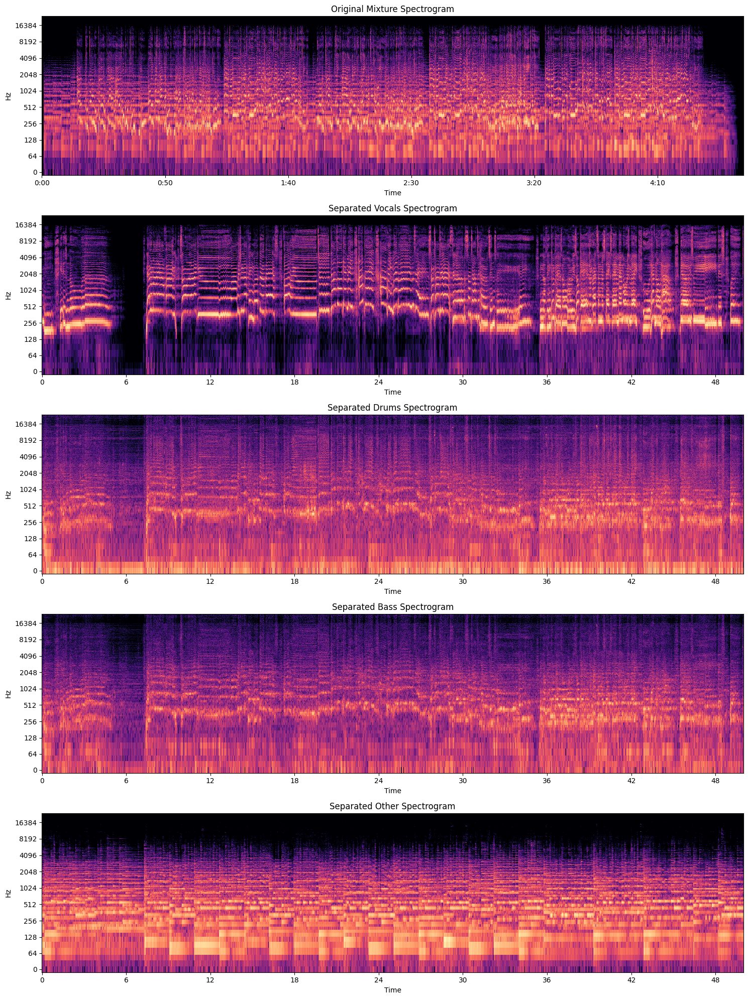

In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

#load test wav file
mix, sr = librosa.load("/content/test.wav", sr=sample_rate, mono=True)

#compute the spectrogram waves
n_fft = 2048
hop_length = 512

#get mixture wave
mix_stft = librosa.stft(mix, n_fft=n_fft, hop_length=hop_length)
mix_db = librosa.amplitude_to_db(np.abs(mix_stft), ref=np.max)

#average separated stems
vocals_stft = librosa.stft(vocals_spec.squeeze(0).numpy(), n_fft=n_fft, hop_length=hop_length)
drums_stft = librosa.stft(drums_spec.squeeze(0).numpy(), n_fft=n_fft, hop_length=hop_length)
bass_stft = librosa.stft(bass_spec.squeeze(0).numpy(), n_fft=n_fft, hop_length=hop_length)
other_stft = librosa.stft(other_spec.squeeze(0).numpy(), n_fft=n_fft, hop_length=hop_length)


vocals_stft = np.mean(vocals_stft, axis=0)
drums_stft = np.mean(drums_stft, axis=0)
bass_stft = np.mean(bass_stft, axis=0)
other_stft = np.mean(other_stft, axis=0)


vocals_db = librosa.amplitude_to_db(np.abs(vocals_stft), ref=np.max)
drums_db = librosa.amplitude_to_db(np.abs(drums_stft), ref=np.max)
bass_db = librosa.amplitude_to_db(np.abs(bass_stft), ref=np.max)
other_db = librosa.amplitude_to_db(np.abs(other_stft), ref=np.max)

#plot spectrograms
fig, axs = plt.subplots(5, 1, figsize=(15, 20))

librosa.display.specshow(mix_db, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', ax=axs[0])
axs[0].set_title('Original Mixture Spectrogram')

librosa.display.specshow(vocals_db, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', ax=axs[1])
axs[1].set_title('Separated Vocals Spectrogram')

librosa.display.specshow(drums_db, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', ax=axs[2])
axs[2].set_title('Separated Drums Spectrogram')

librosa.display.specshow(bass_db, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', ax=axs[3])
axs[3].set_title('Separated Bass Spectrogram')

librosa.display.specshow(other_db, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', ax=axs[4])
axs[4].set_title('Separated Other Spectrogram')

plt.tight_layout()
plt.show()

In [ ]:
processor = Wav2Vec2Processor.from_pretrained("facebook/wav2vec2-base-960h")
asr_model = Wav2Vec2ForCTC.from_pretrained("facebook/wav2vec2-base-960h")
asr_model.eval()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
asr_model.to(device)

preprocessor_config.json:   0%|          | 0.00/159 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/163 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.60k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/291 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/85.0 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/378M [00:00<?, ?B/s]

Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base-960h and are newly initialized: ['wav2vec2.masked_spec_embed']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Wav2Vec2ForCTC(
  (wav2vec2): Wav2Vec2Model(
    (feature_extractor): Wav2Vec2FeatureEncoder(
      (conv_layers): ModuleList(
        (0): Wav2Vec2GroupNormConvLayer(
          (conv): Conv1d(1, 512, kernel_size=(10,), stride=(5,), bias=False)
          (activation): GELUActivation()
          (layer_norm): GroupNorm(512, 512, eps=1e-05, affine=True)
        )
        (1-4): 4 x Wav2Vec2NoLayerNormConvLayer(
          (conv): Conv1d(512, 512, kernel_size=(3,), stride=(2,), bias=False)
          (activation): GELUActivation()
        )
        (5-6): 2 x Wav2Vec2NoLayerNormConvLayer(
          (conv): Conv1d(512, 512, kernel_size=(2,), stride=(2,), bias=False)
          (activation): GELUActivation()
        )
      )
    )
    (feature_projection): Wav2Vec2FeatureProjection(
      (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (projection): Linear(in_features=512, out_features=768, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder)

In [ ]:
vocals_audio = audios["vocals"].cpu()

# If stereo → make mono
if vocals_audio.shape[0] > 1:
    vocals_audio = vocals_audio.mean(dim=0, keepdim=True)

# Resample to 16kHz (Wav2Vec2 requirement)
target_sr = 16000
sample_rate = 44100  # your original sample rate

resampler = torchaudio.transforms.Resample(orig_freq=sample_rate, new_freq=target_sr)
vocals_audio = resampler(vocals_audio)

# Remove batch dimension
vocals_audio = vocals_audio.squeeze(0)

# Set chunk size
chunk_duration = 15  # seconds
chunk_size = chunk_duration * target_sr  # samples per chunk

# Chunk and transcribe
full_transcript = []

print("🎤 Starting chunked transcription...\n")

for start in range(0, vocals_audio.shape[0], chunk_size):
    end = min(start + chunk_size, vocals_audio.shape[0])
    chunk = vocals_audio[start:end]

    # Skip very short chunks
    if chunk.shape[0] < target_sr * 2:  # less than 2 seconds
        continue

    # Prepare input
    input_values = processor(chunk, sampling_rate=target_sr, return_tensors="pt").input_values
    input_values = input_values.to(device)

    # Predict
    with torch.no_grad():
        logits = asr_model(input_values).logits

    predicted_ids = torch.argmax(logits, dim=-1)
    transcription = processor.decode(predicted_ids[0])

    # Save this chunk's text
    full_transcript.append(transcription)

    print(f"Chunk {start/target_sr:.1f}-{end/target_sr:.1f} sec:\n{transcription}\n")

# Join all chunks together
final_text = "\n".join(full_transcript)

# Output final full text
print("\n🎶 Final Full Predicted Lyrics:\n")
print(final_text)

🎤 Starting chunked transcription...

Chunk 0.0-15.0 sec:
O

Chunk 15.0-30.0 sec:
H H THAT YOOER SETTLE DON THAT YE FOUN A G ANY O MARRY A

Chunk 30.0-45.0 sec:
AA HA DAT'S YE OLD DREAMS CAME TOO GUESS SHE GAVE THINGS I DN GIVE TO YOU

Chunk 45.0-60.0 sec:
OLD FREN WHYN SOLD SHI AIN'T LIKE YO D HOLD BAG  HI

Chunk 60.0-75.0 sec:
T FROM E LID I HATE TO TURN OUT BATTLE OF THE BL UN INVIT IT BUT I COULDN'T STAY AWAAYY I COULDN'T FIGHT IT I I HOPED YOU'D SEE MY FACE AN THAT YOU'D BE REMINDED THAT FROM ME

Chunk 75.0-90.0 sec:
IT IS NOOW NEVER MI O FINE SO IKE YOU A WHIS NOTHING BU HE BE

Chunk 90.0-105.0 sec:
ES AY D DOFF  GEMBAT AAN A REMEMBOU SAI SOMETIMES ES AND LO

Chunk 105.0-120.0 sec:
BUT SOMETIMES IT URS INC TEAD SOMETIMES IT LESS AN LUS BUT SOMETIMES IT OSIN STA A

Chunk 120.0-135.0 sec:
YOU KN HOWTE TIME FLINES ONLY YESTER DAY WAZ THE TIME O

Chunk 135.0-150.0 sec:
ASWE WERBONE AND RAYS IN A SUMMER HAS BOUND BA DE SURPRISE AL THOU A GLORYYYY D

Chunk 150.0-165.0 sec:
S I TO TURN O

In [ ]:
import whisper
import soundfile as sf
import numpy as np

# Load Whisper model
model = whisper.load_model("small")

# Get the Demucs separated vocals waveform
vocals_audio = audios["vocals"].cpu()

#mono
if vocals_audio.shape[0] > 1:
    vocals_audio = vocals_audio.mean(dim=0, keepdim=True) #average

# Remove extra dimensions
vocals_audio = vocals_audio.squeeze(0)

# Now vocals_audio should be shape: (samples,)

# Convert to numpy float32
vocals = vocals_audio.numpy().astype(np.float32)

# Save as WAV correctly
sf.write('/content/vocals_temp.wav', vocals, sample_rate)

#transcribe using whisper
result = model.transcribe('/content/vocals_temp.wav')
print("\nPredicted Lyrics:\n")
print(result["text"])



Predicted Lyrics:

 I heard that you're settled down, that you found a girl and you're married now. I heard that your dreams came true, guess she gave you things I didn't give to you. Oh friend, why are you so shy? Ain't like you to hold back or hide from the light. I hate to turn up out of the blue uninvited but I couldn't stay away, I couldn't fight it. I had hoped you'd see my face and that you'd be reminded that for me it isn't over. Never might I find someone like you, I wish nothing but the best of you to. Don't forget me, I beg, I remember you say. Sometimes it lasts and loves but sometimes it hurts instead. Sometimes it lasts and loves but sometimes it hurts instead. You know how the time flies only. Yesterday was the time of our lives. We were born and raised in a summer haze bound by the surprise of our glory days. I hate to turn up out of the blue uninvited but I couldn't stay away, I couldn't fight it. I had hoped you'd see my face and that you'd be reminded that for me it